# Parse the Event data

# Moving onto Event data

This file is basically an event file joined with some “insights” from the tracking data.

The important thing is you can see which events have passes, shots, etc while being able to match this information with the tracking data (check out the ‘frame’ and ‘game clock’ columns).

This should help get you started with linking the two datasets and tagging events in the pitch control model when you get to that.

Please let me know if you have any questions about either of the datasets, I may not get back to you tomorrow but will try to on Sunday.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import copy

In [2]:
import sys  
sys.path.insert(0, '/Volumes/Transcend/DataScience/data_bootcamp/data/cap_data')

In [3]:
import Metrica_IO_CF as mio
import Metrica_Viz_CF as mviz
import Metrica_Velocities_CF as mvel
import matplotlib.animation as manimation

In [4]:
DATADIR = "/Volumes/Transcend/DataScience/data_bootcamp/data/cap_data"

In [5]:
DATADIR

'/Volumes/Transcend/DataScience/data_bootcamp/data/cap_data'

In [6]:
game_id='/game_1'

In [8]:
events=pd.read_csv(DATADIR+game_id+'/2057613_insight_resort.csv')

In [9]:
events.tail()

,MATCH_DATE,MATCH_ID,COMPETITION_ID,SEASON_ID,MATCH_TYPE,ROUND_TYPE,ID,EVENTID,TIMESTAMP,TYPE_ID,...,Event_Number,Distance_Carried,Distance_Carried_meters,ZONE_INDEX,END_ZONE_INDEX,X_ZONE,XEND_ZONE,Y_ZONE,YEND_ZONE,GOAL_DIFF
1765,2020-02-19,2057613,1083,2019,Regular,League,2.185080e+09,730.0,2020-02-19 18:49:14.430000,1,...,1765,0.0,0.0,53,51.0,"(50.0, 58.33)","(50.0, 58.33)","(62.5, 75.0)","(37.5, 50.0)",-2
1766,2020-02-19,2057613,1083,2019,Regular,League,2.185080e+09,731.0,2020-02-19 18:49:19.446000,1,...,1766,0.0,0.0,59,79.0,"(58.33, 66.67)","(75.0, 83.33)","(37.5, 50.0)","(87.5, 100.0)",-2
1767,2020-02-19,2057613,1083,2019,Regular,League,2.185080e+09,732.0,2020-02-19 18:49:23.607000,1,...,1767,0.0,0.0,79,70.0,"(75.0, 83.33)","(66.67, 75.0)","(87.5, 100.0)","(75.0, 87.5)",-2
1768,2020-02-19,2057613,1083,2019,Regular,League,2.185080e+09,733.0,2020-02-19 18:49:25.857000,1,...,1768,0.0,0.0,70,69.0,"(66.67, 75.0)","(66.67, 75.0)","(75.0, 87.5)","(62.5, 75.0)",-2
1769,2020-02-19,2057613,1083,2019,Regular,League,2.185080e+09,734.0,2020-02-19 18:49:28.377000,1,...,1769,0.0,0.0,68,59.0,"(66.67, 75.0)","(58.33, 66.67)","(50.0, 62.5)","(37.5, 50.0)",-2


In [10]:
events.shape

(1770, 224)

**USE ATHLETE_ID_OPTA over PLAYER_ID because it has less missing values**

In [11]:
events=events.rename(columns={'X':'Start X','Y':'Start Y','XEND':'End X','YEND':'End Y','FRAME_IDX':'Start Frame',
                              'TYPE_ID':'Type','ATHLETE_ID_OPTA':'From','RECEIVER_ID':'To','HOME_AWAY':'Team','PERIODID':'Period'})

In [12]:
#Add in "Start time" to dataframe (divide frame by freq) = frame/25 (Hz)
events['Start Time [s]']=events['Start Frame']/25

In [13]:
events.columns

Index(['MATCH_DATE', 'MATCH_ID', 'COMPETITION_ID', 'SEASON_ID', 'MATCH_TYPE',
       'ROUND_TYPE', 'ID', 'EVENTID', 'TIMESTAMP', 'Type',
       ...
       'Distance_Carried', 'Distance_Carried_meters', 'ZONE_INDEX',
       'END_ZONE_INDEX', 'X_ZONE', 'XEND_ZONE', 'Y_ZONE', 'YEND_ZONE',
       'GOAL_DIFF', 'Start Time [s]'],
      dtype='object', length=225)

## First event file I worked with had a LOT more info - so the cell below won't work for this set

In [14]:
events=events[['Team','Type','From','To','Start X','Start Y','End X','End Y','Start Frame','Start Time [s]','Period',
            'SHOTS_ON_TARGET','SHOTS_OFF_TARGET','DISPOSSESSED','POSSESSION_LOST','SHOT_QUALITY',
               'POSSESSION_EVENTS','POSSESSION_START_CLOCK','POSSESSION_END_CLOCK','POSSESSION_START_FRAMEIDX',
               'POSSESSION_END_FRAMEIDX','GOAL_Y_COORDINATE',
               'GOAL_Z_COORDINATE',
               'PASSES_SUCCESSFUL','PASSES_UNSUCCESSFUL','PASS_DIFFICULTY']]

In [15]:
event_list=pd.read_csv(DATADIR+'/opta_events.csv')

### Adding `Subtype` column to event data which gives more context as to what each TYPE_ID is

In [16]:
# initializing lists 
test_keys = list(event_list['TYPE_ID'])
test_values = list(event_list['EVENT_TYPE'])
# using zip() 
# to convert lists to dictionary 
event_dict = dict(zip(test_keys, test_values)) 

In [17]:
#Creating Sybtype column
subtype=[]
for i in range(len( events)):
    subtype.append(event_dict[events['Type'].iloc[i]])


In [18]:
if len(subtype) == events.shape[0]:
    events['Subtype']=subtype
else:
    'uh oh, you\'ve got a length mismatch between your list and the events dataframe'

In [19]:
print('There are ', len(events[events['Start Frame'].isnull()]), 'rows with no start frames')

There are  58 rows with no start frames


## Dropping NA frames

In [20]:
events=events.dropna(subset=['Start Frame'])

In [21]:
events.shape

(1712, 27)

## barely any frames were missing

## Get Event Data into proper Coordinate system and units

Text(0.5, 1.0, 'Original Coordinate System of Event Data')

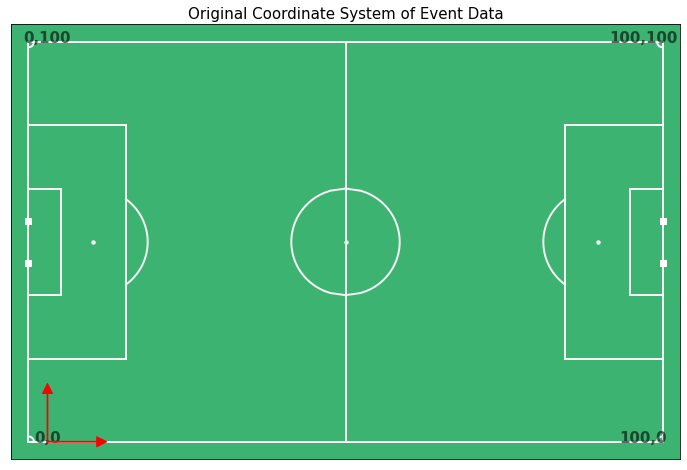

In [22]:
# Plot the first goal
fig,ax = mviz.plot_pitch()
## Coordinate system and Origin

ax.annotate("{},{}".format(0,0), xy=(-100.584/2,-68.58/2),
            alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')

ax.annotate("", xy=(-100.584/2,-48.58/2), xytext=(-100.584/2,-68.58/2), alpha=1, arrowprops=dict(alpha=1,width=.75,headlength=10.0,headwidth=10.0,color='red'))
ax.annotate("", xy=(-80.584/2,-68.58/2), xytext=(-100.584/2,-68.58/2), alpha=1, arrowprops=dict(alpha=1,width=.75,headlength=10,headwidth=10,color='red'))

# Remaining Pitch Units/Coor Sys
ax.annotate("{},{}".format(100,100), xy=(100.584/2,68.58/2),
            alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')

ax.annotate("{},{}".format(100,0), xy=(100.584/2,-68.58/2),
            alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')

ax.annotate("{},{}".format(0,100), xy=(-100.584/2,68.58/2),
            alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')
ax.set_title('Original Coordinate System of Event Data',fontsize=15)

Text(0.5, 1.0, 'Event transformation coordinates to match tracking data')

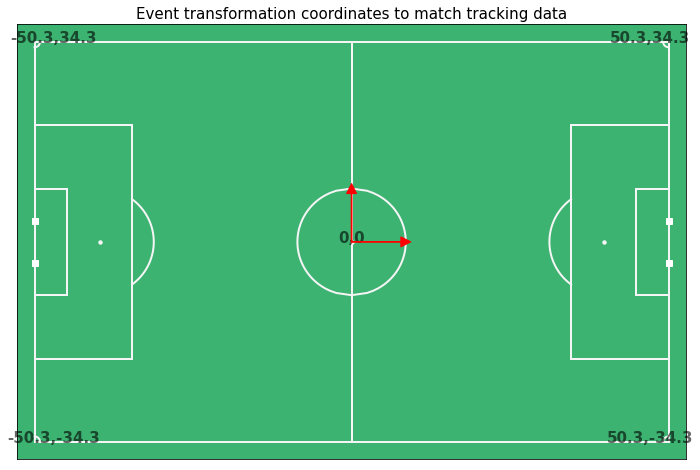

In [23]:
# Plot the first goal
fig,ax = mviz.plot_pitch()
## Coordinate system and Origin
ax.annotate("0,0", xy=(0,0),alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')
ax.annotate("", xy=(0,10), xytext=(0,0), alpha=1, arrowprops=dict(alpha=1,width=.75,headlength=10.0,headwidth=10.0,color='red'))
ax.annotate("", xy=(10,0), xytext=(0,0), alpha=1, arrowprops=dict(alpha=1,width=.75,headlength=10,headwidth=10,color='red'))

# Remaining Pitch Units/Coor Sys
ax.annotate("{},{}".format(round(-100.584/2,1),round(-68.58/2,1)), xy=(-100.584/2,-68.58/2),
            alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')

ax.annotate("{},{}".format(round(100.584/2,1),round(-68.58/2,1)), xy=(100.584/2,-68.58/2),
            alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')

ax.annotate("{},{}".format(round(-100.584/2,1),round(68.58/2,1)), xy=(-100.584/2,68.58/2),
            alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')

ax.annotate("{},{}".format(round(100.584/2,1),round(68.58/2,1)), xy=(100.584/2,68.58/2),
            alpha=0.6,color='black',fontsize=15,ha='center',weight='bold')

ax.set_title('Event transformation coordinates to match tracking data',fontsize=15)

## Fun Facts Regarding Event Coordinates/Data

**Event Data**

The event data is tagged 0-100 for ‘X’ column and ‘Y’ column. This is starting in the bottom L corner of the pitch. So 0 and 0 in both columns would be bottom left, 100,100 for the column values would be top right, etc.

Additionally, you have this fun little diddy for events:
- 0 your goal keeper, 
- 100 - opposing keeper

need to normalize the event data to the correct direction
always left right

**Tracking Data**

There 0,0 coordinate is the middle of the pitch, and the X coordinates and Y coordinates are the number of metres moved from that location, where the pitch length (X) and pitch width (Y) dimensions of this pitch are listed below

pitchLength: 100.584,
pitchWidth: 68.58,

Already processed so home team is ALWAYS attacking right to left

## Upload cleaned tracking data

In [24]:
tracking_home=pd.read_csv(DATADIR+game_id+'/tracking_home.csv')
tracking_away=pd.read_csv(DATADIR+game_id+'/tracking_away.csv')

In [25]:
tracking_home.head()

,frameIdx,home_2_x,home_2_y,home_2_z,home_4_x,home_4_y,home_4_z,home_5_x,home_5_y,home_5_z,...,home_5_vx,home_5_vy,home_5_speed,home_6_vx,home_6_vy,home_6_speed,home_72_vx,home_72_vy,home_72_speed,ball_speed
0,0,NaN,NaN,NaN,18.47,-2.79,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.49
1,1,NaN,NaN,NaN,18.47,-2.80,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.33
2,2,NaN,NaN,NaN,18.47,-2.82,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.12
3,3,NaN,NaN,NaN,18.45,-2.84,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.79
4,4,NaN,NaN,NaN,18.43,-2.87,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.178571,0.142857,0.228683,-0.178571,0.0,0.178571,4.39


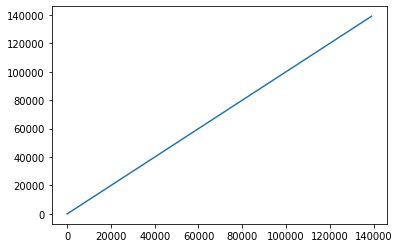

In [26]:
plt.plot(tracking_home['frameIdx'])

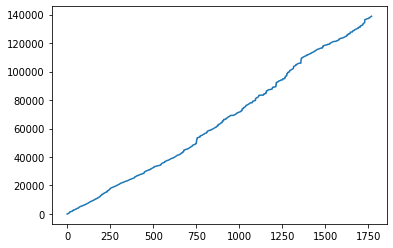

In [27]:
plt.plot(events['Start Frame'].index,events['Start Frame'].sort_values())

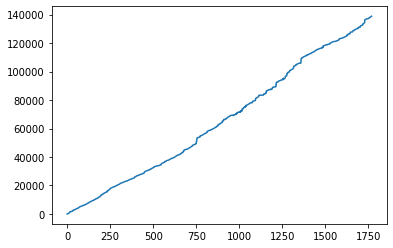

In [28]:
plt.plot(events['Start Frame'])

## Check that tracking data has been pre-processed - home team always attacking right to left

## Beginning of game sample frame

Text(0.5, 0, 'Home = Red        Away = Blue')

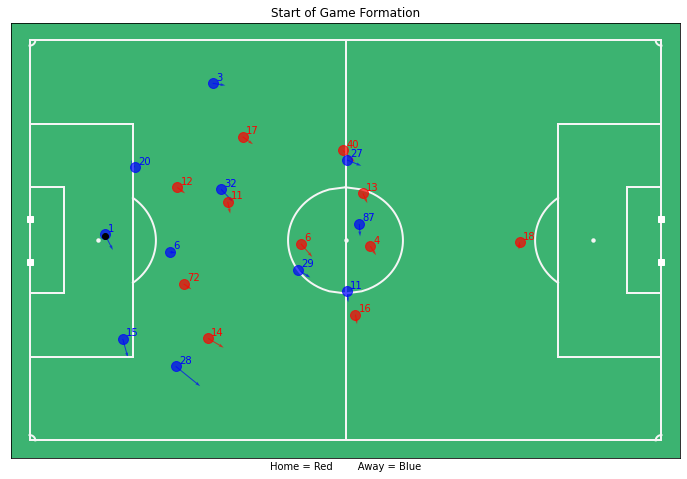

In [29]:
# plot a random frame, plotting the player velocities using quivers
mviz.plot_frame(tracking_home.loc[1000], tracking_away.loc[1000], include_player_velocities=True, annotate=True,field_dimen=(100.6,68.9))
plt.title('Start of Game Formation')
plt.xlabel('Home = Red        Away = Blue')

## End of Game sample frame

Text(0.5, 0, 'Home = Red        Away = Blue')

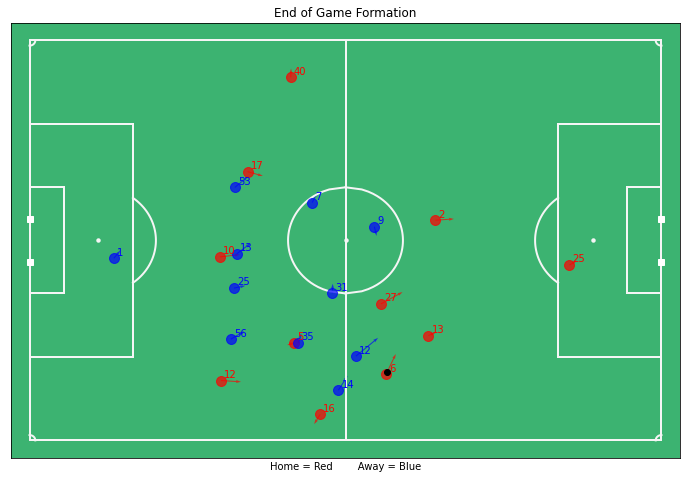

In [30]:
# plot a random frame, plotting the player velocities using quivers
mviz.plot_frame(tracking_home.loc[110000], tracking_away.loc[110000], include_player_velocities=True, annotate=True,field_dimen=(100.6,68.9))
plt.title('End of Game Formation')
plt.xlabel('Home = Red        Away = Blue')

## Plotting X, Y Coordinates to visually show how they are transformed

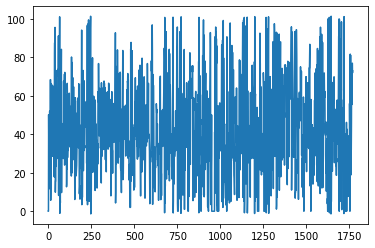

In [31]:
plt.plot(events['Start X'])

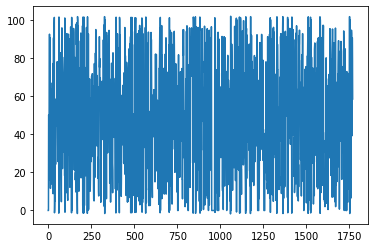

In [32]:
plt.plot(events['Start Y'])

## STEP 1: Adjusting Coordinate System
 - changing coordinate origin to be in the middle of the field
 - adjusting units to be field dimensions instead of % pitch

In [33]:
def change_event_coords(events_dataframe, field_dims):
    ''' changing the units and coordinate system for the events dataframe.
    FIRST: subtract 50 from both X & Y - this shifts origin from left corner to middle of pitch.
    SECOND: change units from % X/Y to meters (this uses the field dimensions the user inputs (106, 68))
    instead of -50 to 50 for Y - it should be -68/2 to 68/2
    instead of -50 to 50 for X - it should be -106/2 to 106/2'''
    half_coords=100/2
    length_ratio=50/(field_dims[0]/2)
    width_ratio=50/(field_dims[1]/2)
    
    events_dataframe['Start X']=(events_dataframe['Start X']-half_coords)/length_ratio
    events_dataframe['Start Y']=(events_dataframe['Start Y']-half_coords)/width_ratio
    events_dataframe['End X']=(events_dataframe['End X']-half_coords)/length_ratio
    events_dataframe['End Y']=(events_dataframe['End Y']-half_coords)/width_ratio
    return events_dataframe

In [34]:
events=change_event_coords(events,(100.7,68,6))

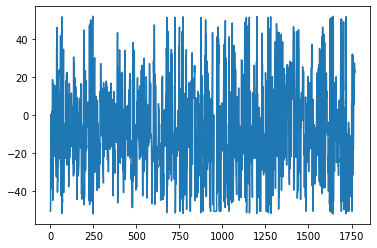

In [35]:
plt.plot(events['Start X'])

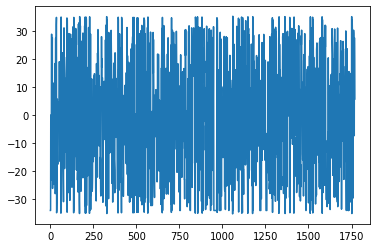

In [36]:
plt.plot(events['Start Y'])

## STEP 2: Normalize the way X,Y events are plotted
- 0 is defending goalkeeper,
- 100 is attacking goalkeeper

Need to normalize all events so I can plot events regardless of Home/Away possession



In [37]:
def isNaN(num):
    '''cute lil guy that determines if an element is nan or not'''
    return num != num

## Now need to do the last step which is to "Flip" the home team event data such that it works with a right to left coordinate system

In [38]:
events.shape

(1712, 27)

## Assuming Home team starts on rights side - playing right to left

We need to "flip" all home events in the first half AND second half (because we already switched that to match the tracking data)

In [39]:
def flip_home_events(events):
    events.loc[events['Team']== 'Home', ['Start X','Start Y','End X', 'End Y']] = events[['Start X','Start Y','End X', 'End Y']]*-1
    return events

In [40]:
events=flip_home_events(events)

In [41]:
events.shape

(1712, 27)

----
----
----
----
----
----


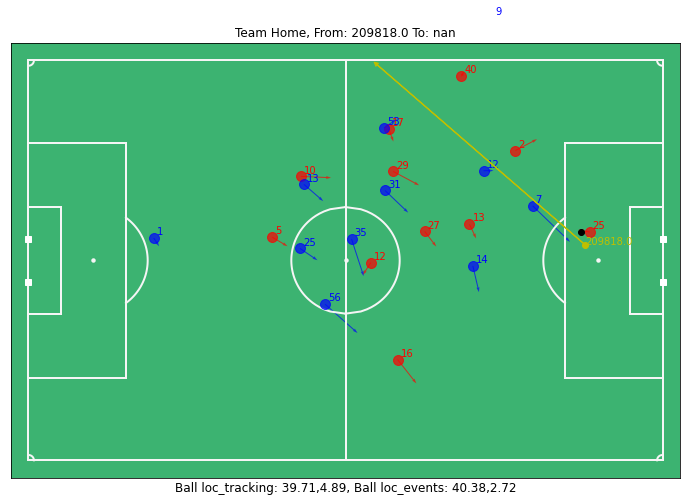

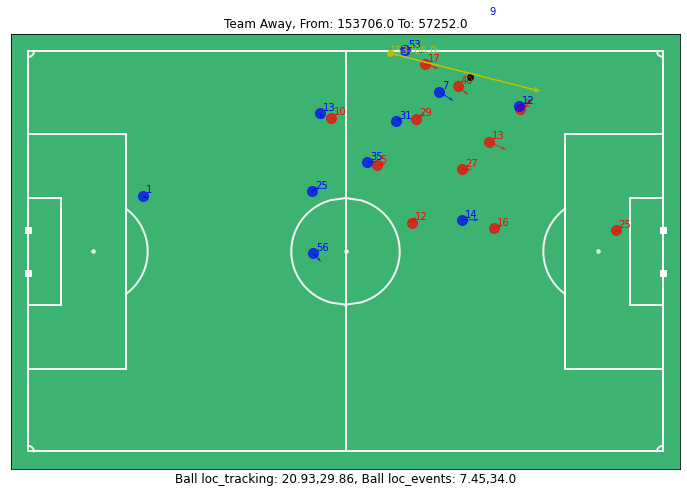

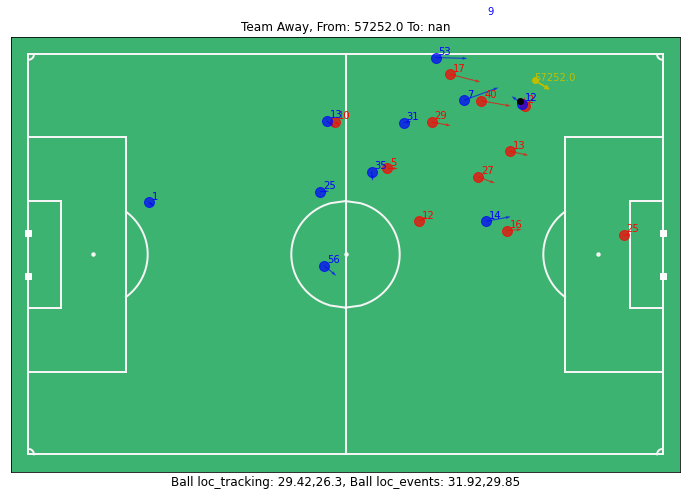

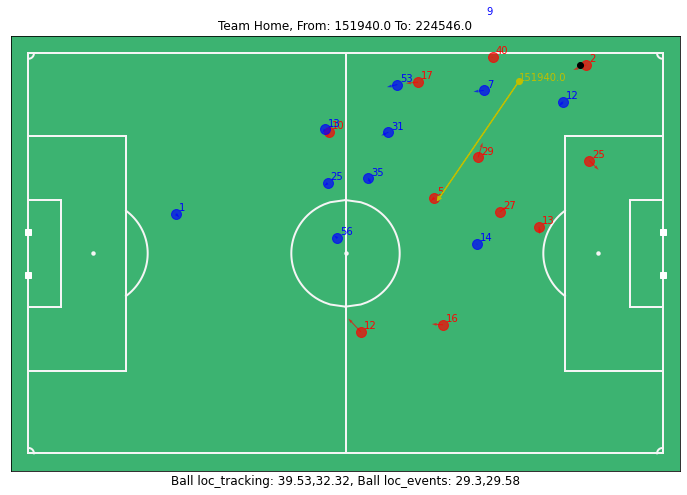

In [42]:
for i,row in events.iloc[-20:-10].iterrows():
    if isNaN(row['End X']):
        print('----')
    else:
        event_frame=row['Start Frame']
        fig,ax=mviz.plot_frame(tracking_home.loc[event_frame], tracking_away.loc[event_frame],include_player_velocities=True, annotate=True)# plot the 3 events leading up to the second goal
        mviz.plot_events(pd.DataFrame(row).T.loc[i:i], color='y', alpha=1.0,indicators = ['Marker','Arrow'], annotate=True,figax = (fig,ax))
        ## need this line for dataset with no "receiver ID/To"
        ax.set_title("Team {}, From: {} To: {}".format(row['Team'],row['From'],row['To']))
        ##
#         ax.set_title("Team {}, From: {} To: {}".format(row['Team'],row['From'], row['To']))
        ax.set_xlabel("Ball loc_tracking: {},{}, Ball loc_events: {},{}".format(tracking_home['ball_x'].loc[event_frame],
                                                                                tracking_home['ball_y'].loc[event_frame],
                                                                                round(row['Start X'],2), round(row['Start Y'],2)),fontsize=12)



----
----
----
----
----
----


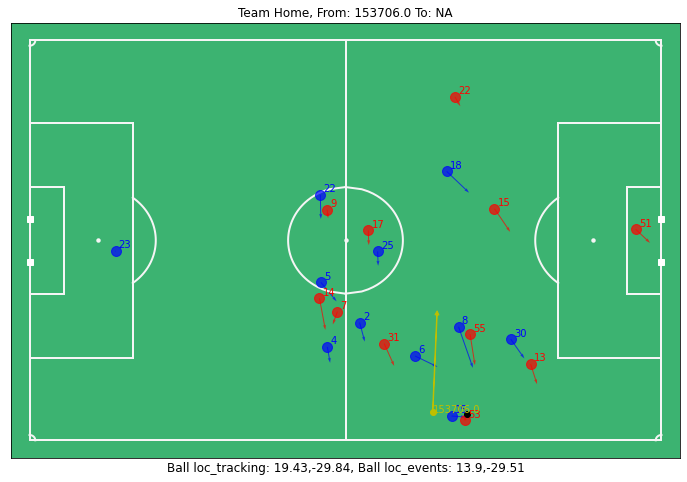

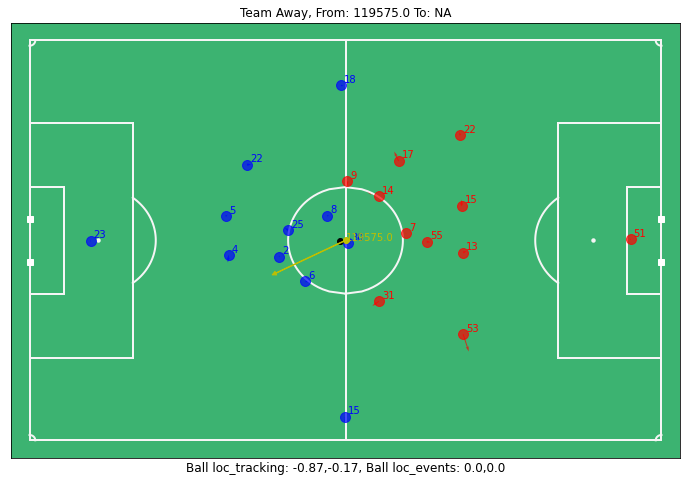

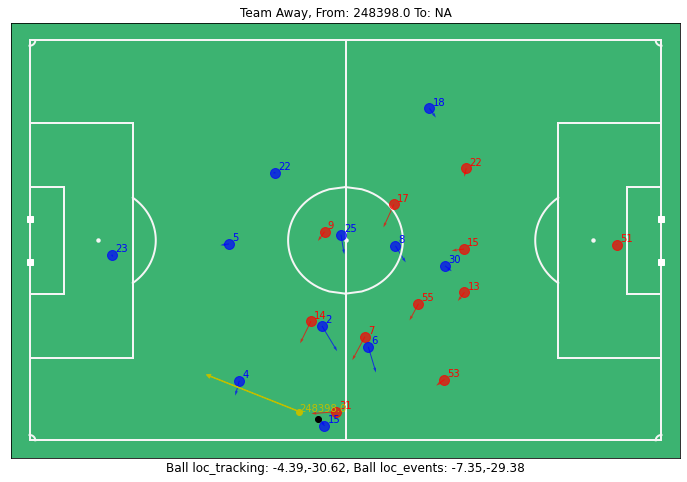

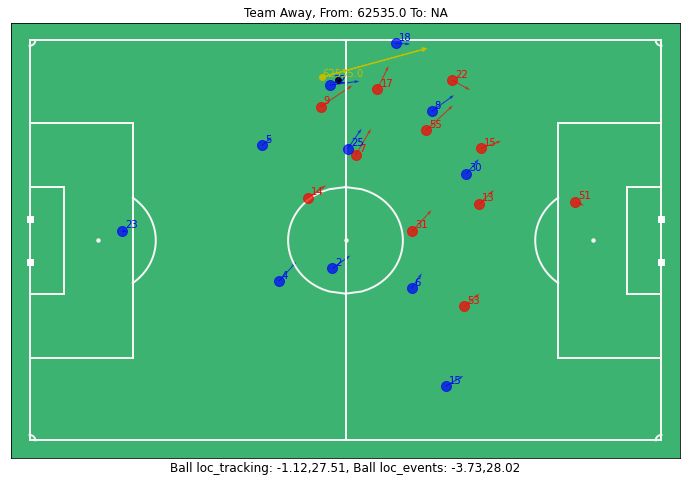

In [43]:
for i,row in events.iloc[10:20].iterrows():
    if isNaN(row['End X']):
        print('----')
    else:
        event_frame=row['Start Frame']
        fig,ax=mviz.plot_frame(tracking_home.loc[event_frame], tracking_away.loc[event_frame],include_player_velocities=True, annotate=True)# plot the 3 events leading up to the second goal
        mviz.plot_events(events.loc[i:i], color='y', alpha=1.0,indicators = ['Marker','Arrow'], annotate=True,figax = (fig,ax))
        ## need this line for dataset with no "receiver ID/To"
        ax.set_title("Team {}, From: {} To: NA".format(row['Team'],row['From']))
        ##
        #ax.set_title("Team {}, From: {} To: {}".format(row['Team'],row['From'], row['To']))
        ax.set_xlabel("Ball loc_tracking: {},{}, Ball loc_events: {},{}".format(tracking_home['ball_x'].loc[event_frame],
                                                                                tracking_home['ball_y'].loc[event_frame],
                                                                                round(row['Start X'],2), round(row['Start Y'],2)),fontsize=12)



# MERGING EVENTS TO TRACKING

In [45]:
# just making a copy, nothing to see here
events_copy=copy.deepcopy(events)

# Plotting Specific Events

In [46]:
events[events['Subtype']=='Goal']

,Team,Type,From,To,Start X,Start Y,End X,End Y,Start Frame,Start Time [s],...,POSSESSION_START_CLOCK,POSSESSION_END_CLOCK,POSSESSION_START_FRAMEIDX,POSSESSION_END_FRAMEIDX,GOAL_Y_COORDINATE,GOAL_Z_COORDINATE,PASSES_SUCCESSFUL,PASSES_UNSUCCESSFUL,PASS_DIFFICULTY,Subtype
61,Home,16,421350.0,NaN,-41.7905,13.124,NaN,NaN,10428,417.12,...,NaN,NaN,NaN,NaN,54.2,3.2,NaN,NaN,NaN,Goal
365,Away,16,218350.0,NaN,46.1206,5.508,NaN,NaN,22368,894.72,...,NaN,NaN,NaN,NaN,52.3,3.2,NaN,NaN,NaN,Goal
613,Away,16,82752.0,NaN,38.7695,0.000,NaN,NaN,67881,2715.24,...,NaN,NaN,NaN,NaN,46.3,13.3,NaN,NaN,NaN,Goal
873,Away,16,182906.0,NaN,41.8912,3.604,NaN,NaN,81789,3271.56,...,NaN,NaN,NaN,NaN,47.2,2.5,NaN,NaN,NaN,Goal
977,Away,16,119575.0,NaN,45.2143,2.176,NaN,NaN,93935,3757.40,...,NaN,NaN,NaN,NaN,47.7,1.9,NaN,NaN,NaN,Goal
1103,Away,16,89080.0,NaN,-42.8982,-4.692,NaN,NaN,104220,4168.80,...,NaN,NaN,NaN,NaN,52.6,15.8,NaN,NaN,NaN,Goal


In [47]:
def clip_array(frame,clip_length):
    if frame-clip_length*.75>0:
        start_frame=frame-clip_length*.75
        end_frame=frame+clip_length*.25
    elif frame-clip_length*.25>0:
        start_frame=frame-clip_length*.25
        end_frame=frame+clip_length*.75
    else:
        start_frame=frame-25
        end_frame=frame+(clip_length-25)
    return int(start_frame),int(end_frame)

In [59]:
events['Start Frame'].loc[61]

10428

In [49]:
start_frame,end_frame=clip_array(events['Start Frame'].loc[61],700)

Test a short clip that includes player velocities

In [60]:
### This line is working but blanked it out because gif is already built
# Making a movie of the second home team goal
PLOTDIR = DATADIR+game_id
mviz.save_match_clip(tracking_home.iloc[9164:9280],tracking_away.iloc[9164:9280],PLOTDIR,fname='test_clip',include_player_velocities=True,annotate=True)

Generating movie...done



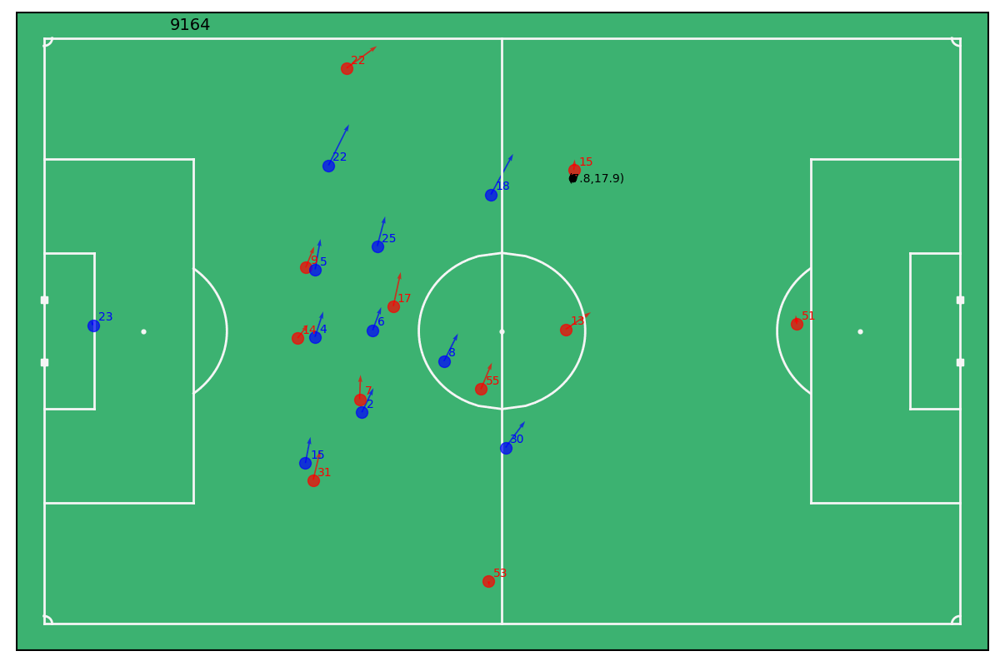

In [61]:
#Display the animation...
import io
import base64
from IPython.display import HTML

filename = '/test_clip.gif'

video = io.open(DATADIR+game_id+filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

## Plot the 3 passes that lead up to that goal

In [ ]:
events.loc[57:63]

In [ ]:
%%time
PLOTDIR = DATADIR+game_id
mviz.save_match_clip(tracking_home.iloc[9164:9280],tracking_away.iloc[9164:9280],PLOTDIR,fname='test_clip_annotate3',include_player_velocities=True, annotate=True)



In [ ]:
#Display the animation...
import io
import base64
from IPython.display import HTML

filename = '/test_clip_annotate3.gif'

video = io.open(DATADIR+game_id+filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

In [ ]:
# plot a random frame, plotting the player velocities using quivers

fig,ax=mviz.plot_frame(tracking_home.loc[events['Start Frame'].loc[61]], tracking_away.loc[events['Start Frame'].loc[61]], include_player_velocities=True, annotate=True)

# plot the 2 passes leading up to the second goal
mviz.plot_events(events.loc[57:60], color='y', alpha=1,indicators = ['Marker','Arrow'], annotate=True,figax=(fig,ax) )

In [ ]:
for i,row in events.loc[57:62].iterrows():
    if isNaN(row['End X']):
        print('----')
    else:
        event_frame=row['Start Frame']
        fig,ax=mviz.plot_frame(tracking_home.loc[event_frame], tracking_away.loc[event_frame],include_player_velocities=True, annotate=True)# plot the 3 events leading up to the second goal
        mviz.plot_events(events.loc[i:i], color='y', alpha=1.0,indicators = ['Marker','Arrow'], annotate=True,figax = (fig,ax))
#         ## need this line for dataset with no "receiver ID/To"
#         ax.set_title("Team {}, From: {} To: NA".format(row['Team'],row['From']))
#         ##
        ax.set_title("Team {}, From: {} To: {}, Frame: {}".format(row['Team'],row['From'], row['To'], row['Start Frame']))
        ax.set_xlabel("Ball loc_tracking: {},{}, Ball loc_events: {},{}".format(tracking_home['ball_x'].loc[event_frame],
                                                                                tracking_home['ball_y'].loc[event_frame],
                                                                                round(row['Start X'],2), round(row['Start Y'],2)),fontsize=12)


# Second Goal Issues

### NOTE THE FRAME NUMBER AFTER EVENT 1358 - big jump

In [ ]:
events.loc[760:770]

In [ ]:
events['Start Frame'].loc[766]

In [ ]:
# plot a random frame, plotting the player velocities using quivers

fig,ax=mviz.plot_frame(tracking_home.loc[events['Start Frame'].loc[766]], tracking_away.loc[events['Start Frame'].loc[766]], include_player_velocities=True, annotate=True)

# plot the 4 events leading up to the second goal
mviz.plot_events(events.loc[760:763], color='y', alpha=1,indicators = ['Marker','Arrow'], annotate=True,figax=(fig,ax) )

Not sure if there is an issue with tracking data here - there could have been a stoppage due to a foul so looking into that

## Stoppages could be an issue - I'll look into some more. But for the most part, events are lining up well

# Merge event data with tracking data on Start Frame

In [ ]:
tracking_home.tail()

In [53]:
events.reset_index()

,index,Team,Type,From,To,Start X,Start Y,End X,End Y,Start Frame,...,POSSESSION_START_CLOCK,POSSESSION_END_CLOCK,POSSESSION_START_FRAMEIDX,POSSESSION_END_FRAMEIDX,GOAL_Y_COORDINATE,GOAL_Z_COORDINATE,PASSES_SUCCESSFUL,PASSES_UNSUCCESSFUL,PASS_DIFFICULTY,Subtype
0,0,Home,1,248397.0,421350.0,28.9009,12.104,-16.4141,12.920,1209,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,0.4093,Pass
1,1,Away,49,62535.0,NaN,-23.6645,30.192,NaN,NaN,1410,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ball_recovery
2,2,Away,1,62535.0,218350.0,-24.4701,30.192,-1.3091,30.600,1418,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,0.5742,Pass
3,3,Away,49,182906.0,NaN,-23.0603,-27.744,NaN,NaN,2134,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ball_recovery
4,4,Away,1,82752.0,443720.0,40.9849,30.804,13.3931,16.320,4832,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,0.9712,Pass
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1509,1509,Home,1,245005.0,54756.0,-37.7625,23.324,-38.8702,-0.748,146760,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2444,Pass
1510,1510,Away,74,248398.0,NaN,-45.0129,-12.580,NaN,NaN,147002,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2353,Blocked_Pass
1511,1511,Home,1,92437.0,244407.0,5.9413,-14.552,12.3861,-10.064,148117,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,0.9184,Pass
1512,1512,Home,1,244407.0,228760.0,12.3861,-10.064,18.7302,-21.352,148139,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,0.9438,Pass


In [54]:
events=events.merge(tracking_home[['frameIdx','ball_x','ball_y','ball_z']],
                                            how='left',left_on=['Start Frame'],right_on=['frameIdx'])

In [55]:
events.shape

(1514, 31)

## Check out events data frame to make sure the Merge didn't do any funny biz

In [ ]:
events=events.set_index('index')

In [56]:
events.loc[131:134]

,Team,Type,From,To,Start X,Start Y,End X,End Y,Start Frame,Start Time [s],...,GOAL_Y_COORDINATE,GOAL_Z_COORDINATE,PASSES_SUCCESSFUL,PASSES_UNSUCCESSFUL,PASS_DIFFICULTY,Subtype,frameIdx,ball_x,ball_y,ball_z
131,Away,1,62535.0,244407.0,9.6672,28.968,7.6532,15.572,10145,405.80,...,NaN,NaN,1.0,NaN,0.4280,Pass,10145,8.66,28.41,0.16
132,Home,44,463568.0,NaN,9.4658,17.136,NaN,NaN,13330,533.20,...,NaN,NaN,NaN,NaN,NaN,Aerial,13330,4.62,19.36,4.19
133,Home,1,244407.0,NaN,9.5665,10.880,4.6322,-27.336,13409,536.36,...,NaN,NaN,1.0,NaN,0.9058,Pass,13409,7.83,10.22,0.19
134,Home,68,NaN,NaN,50.3500,34.000,NaN,NaN,15488,619.52,...,NaN,NaN,NaN,NaN,NaN,Referee_Drop_Ball,15488,13.24,-23.03,0.12


In [ ]:
# plot a random frame, plotting the player velocities using quivers

fig,ax=mviz.plot_frame(tracking_home.loc[102161], tracking_away.loc[102161], include_player_velocities=True, annotate=True)

# plot the 4 events leading up to the second goal
mviz.plot_events(events_copy.loc[1311:1314], color='y', alpha=1,indicators = ['Marker','Arrow'], annotate=True, figax=(fig,ax) )

# Exporting Events to csv so I can use cleaned events in pitch control model

In [ ]:
events.head()

In [57]:
events.reset_index()

,index,Team,Type,From,To,Start X,Start Y,End X,End Y,Start Frame,...,GOAL_Y_COORDINATE,GOAL_Z_COORDINATE,PASSES_SUCCESSFUL,PASSES_UNSUCCESSFUL,PASS_DIFFICULTY,Subtype,frameIdx,ball_x,ball_y,ball_z
0,0,Home,1,248397.0,421350.0,28.9009,12.104,-16.4141,12.920,1209,...,NaN,NaN,1.0,NaN,0.4093,Pass,1209,35.71,10.85,0.12
1,1,Away,49,62535.0,NaN,-23.6645,30.192,NaN,NaN,1410,...,NaN,NaN,NaN,NaN,NaN,Ball_recovery,1410,-20.17,30.99,0.12
2,2,Away,1,62535.0,218350.0,-24.4701,30.192,-1.3091,30.600,1418,...,NaN,NaN,1.0,NaN,0.5742,Pass,1418,-19.11,32.21,0.54
3,3,Away,49,182906.0,NaN,-23.0603,-27.744,NaN,NaN,2134,...,NaN,NaN,NaN,NaN,NaN,Ball_recovery,2134,-22.45,-24.68,0.41
4,4,Away,1,82752.0,443720.0,40.9849,30.804,13.3931,16.320,4832,...,NaN,NaN,1.0,NaN,0.9712,Pass,4832,46.10,31.53,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1509,1509,Home,1,245005.0,54756.0,-37.7625,23.324,-38.8702,-0.748,146760,...,NaN,NaN,NaN,NaN,0.2444,Pass,146760,-40.01,22.57,0.24
1510,1510,Away,74,248398.0,NaN,-45.0129,-12.580,NaN,NaN,147002,...,NaN,NaN,NaN,NaN,0.2353,Blocked_Pass,147002,-50.22,-12.30,0.09
1511,1511,Home,1,92437.0,244407.0,5.9413,-14.552,12.3861,-10.064,148117,...,NaN,NaN,1.0,NaN,0.9184,Pass,148117,5.26,-17.66,0.52
1512,1512,Home,1,244407.0,228760.0,12.3861,-10.064,18.7302,-21.352,148139,...,NaN,NaN,1.0,NaN,0.9438,Pass,148139,9.34,-13.60,0.14


In [58]:
events.reset_index().to_csv(DATADIR+game_id+'/events_cleaned.csv',index=False)